<a href="https://colab.research.google.com/github/SuddenWind/staff_recognition_in_video/blob/main/Irkutsk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Импорты

In [ ]:
# Tesseract 5
!add-apt-repository -y ppa:alex-p/tesseract-ocr-devel
!apt update
!apt install tesseract-ocr
!pip install pytesseract
# !wget https://github.com/tesseract-ocr/tessdata_best/raw/main/rus.traineddata -O /usr/share/tesseract-ocr/5/tessdata/rus.traineddata
!wget https://github.com/tesseract-ocr/tessdata_best/raw/main/eng.traineddata -O /usr/share/tesseract-ocr/5/tessdata/eng.traineddata
# !pip install python-Levenshtein
!tesseract --version

In [ ]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
import pandas as pd

from google.colab.patches import cv2_imshow
from PIL import Image
from os import listdir
import imutils
# import pytesseract

import os, sys
import glob
from tqdm import tqdm

In [ ]:
!apt install cadaver
# !cadaver https://webdav.cloud.mail.ru

In [ ]:
!pip install imageio_ffmpeg

# 1 Time recognition

Распознавание времени на видео

In [ ]:
!unzip train_dataset_irkutsk.zip

In [ ]:
!unzip test_dataset_irkutsk.zip

In [ ]:
# vid = '/content/train/train1.avi'
vid = '/content/test/test.avi'
cap = cv.VideoCapture(vid)

# Get the frames per second
fps = cap.get(cv.CAP_PROP_FPS)

# Get the total numer of frames in the video.
frame_count = cap.get(cv.CAP_PROP_FRAME_COUNT)
print(fps, frame_count)

60.0 747578.0


In [ ]:
config = '--oem 3 --psm 7 -l eng' # -c tessedit_char_whitelist=0123456789-:Tue
frame_count = 0
success = True
time_list = []

while success:
  success, img = cap.read()

  if frame_count % 25 == 0:
    time_img = img[50:110, :560].copy()                          # [100:180, :780] - 1 vid
    time_img = cv.cvtColor(time_img, cv.COLOR_BGR2GRAY)
    time_img[time_img > 240] = 0
    time_img[time_img > 50] = 255
    time_img = cv.resize(time_img, None, fx=0.5, fy=0.5)

    if frame_count % 7500 == 0:                             # 5 minutes
      cv2_imshow(time_img)
      print(pytesseract.image_to_string(time_img, config=config)[:-1])
      print(round(cap.get(cv.CAP_PROP_POS_MSEC)/60000), ' min')

    time_list.append(pytesseract.image_to_string(time_img, config=config)[:-1])

  frame_count += 1
  # if frame_count == 5000:
  #   break

time_list

05-22-2022 Sun 08:25:46
0  min


05-22-2022 Sun 12:08:07
5  min


05-22-2022 Sun 12:54:59
10  min


05-22-2022 Sun 14:05:26
15  min


05-22-2022 Sun 15:26:53
20  min


05-22-2022 Sun 16:05:05
25  min


05-22-2022 Sun 17:10:29
30  min


05-22-2022 Sun 18:28:39
35  min


05-22-2022 Sun-20:57:43
40  min


05-23-2022 Mon 07:31:34
45  min


05-23-2022 Mon 08:02:12
50  min


05-23-2022 Mon 08:10:55
55  min


05-23-2022 Mon 08:43:22
60  min


05-23-2022 Mon 09:07:20
65  min


05-23-2022 Mon 09:18:23
70  min


05-23-2022 Mon 09:59:21
75  min


05-23-2022 Mon 11:14:15
80  min


05-23-2022 Mon 11:31:12
85  min


05-23-2022 Mon 11:41:26
90  min


05-23-2022 Mon 11:49:39
95  min


05-23-2022 Mon 11:56:15
100  min


05-23-2022 Mon 12:02:22
105  min


05-23-2022 Mon 12:10:45
110  min


05-23-2022 Mon 12:30:18
115  min


05-23-2022 Mon 12:54:42
120  min


05-23-2022 Mon 13:30:26
125  min


05-23-2022 Mon 14:04:22
130  min


05-23-2022 Mon 14:33:30
135  min


05-23-2022 Mon 14:44:21
140  min


05-23-2022 Mon 15:17:11
145  min


05-23-2022 Mon 16:36:48
150  min


05-23-2022 Mon 16:48:33
155  min


05-23-2022 Mon 17:01:18
160  min


05-23-2022 Mon 17:18:02
165  min


05-23-2022 Mon 17:46:34
170  min


05-23-2022 Mon 18:09:08
175  min


05-23-2022 Mon-197:36:38
180  min


05-24-2022 Tue-00:03:33
185  min


05-24-2022 Tue 06:54:31
190  min


05-24-2022 Tue 07:18:20
195  min


05-24-2022 Tue 07:38:00
200  min


05-24-2022 Tue 07:49:23
205  min


['05-22-2022 Sun 08:25:46',
 '05-22-2022 Sun 08:25:47',
 '05-22-2022 Sun 08:25:48',
 '05-22-2022 Sun 08:25:49',
 '05-22-2022 Sun 08:25:50',
 '05-22-2022 Sun 08:25:51',
 '05-22-2022 Sun 08:25:52',
 '05-22-2022 Sun 08:25:53',
 '05-22-2022 Sun 08:25:54',
 '05-22-2022 Sun 08:25:55',
 '05-22-2022 Sun 08:25:56',
 '05-22-2022 Sun 08:25:57',
 '05-22-2022 Sun 08:26:01',
 '05-22-2022 Sun 08:26:02',
 '05-22-2022 Sun 08:26:03',
 '05-22-2022 Sun 08:26:04',
 '05-22-2022 Sun 08:26:05',
 '05-22-2022 Sun 08:26:06',
 '05-22-2022 Sun 08:26:07',
 '05-22-2022 Sun 08:26:08',
 '05-22-2022 Sun 08:26:09',
 '05-22-2022 Sun 08:26:10',
 '05-22-2022 Sun 08:26:11',
 '05-22-2022 Sun 08:42:19',
 '05-22-2022 Sun 08:42:20',
 '05-22-2022 Sun 08:42:21',
 '05-22-2022 Sun 08:42:22',
 '05-22-2022 Sun 08:42:23',
 '05-22-2022 Sun 08:42:24',
 '05-22-2022 Sun 08:42:25',
 '05-22-2022 Sun 08:42:26',
 '05-22-2022 Sun 08:42:27',
 '05-22-2022 Sun 08:42:28',
 '05-22-2022 Sun 08:42:29',
 '05-22-2022 Sun 08:42:30',
 '05-22-2022 Sun 08:

In [ ]:
import pickle

with open('/content/drive/MyDrive/Bashko/train2_time.pickle', 'wb') as f:
    pickle.dump(time_list, f)

In [ ]:
import pickle
time_list_pd = pd.DataFrame(time_list)
with open('/content/drive/MyDrive/Bashko/test_time_pd.pickle', 'wb') as f:
    pickle.dump(time_list_pd, f)

In [ ]:
!mv *.pickle /content/drive/MyDrive/Bashko

In [ ]:
#@title
config = '--oem 3 --psm 7 -l eng' # медленно
frame_number = 0
success = True
time_list = []


while success:
  success, img = cap.read()

  time_img = img[100:180, :780].copy()
  time_img = cv.cvtColor(time_img, cv.COLOR_BGR2GRAY)
  time_img[time_img > 240] = 0
  time_img[time_img > 50] = 255
  time_img = cv.resize(time_img, None, fx=0.5, fy=0.5)

  if frame_number % 1500 == 0:
    cv2_imshow(time_img)
    print(pytesseract.image_to_string(time_img, config=config)[:-1])
  time_list.append(pytesseract.image_to_string(time_img, config=config)[:-1])

  frame_number += 25
  cap.set(cv.CAP_PROP_POS_FRAMES, frame_number)
  # if frame_number == 250:
  #   break

time_list

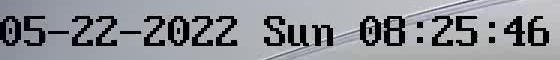

In [ ]:
success, img = cap.read()
cv2_imshow(img[50:110, :560])

# 2 Frame2Train

Нахождение соответствия ключевых кадров из train номеру кадра из видео

In [ ]:
!cp /content/drive/MyDrive/Bashko/*.pickle .

In [ ]:
import pickle

with open('train1_time_pd.pickle', 'rb') as f:
    df = pickle.load(f)
df

,0
0,05-24-2022 Tue 08:08:33
1,05-24-2022 Tue 08:08:34
2,05-24-2022 Tue 08:08:35
3,05-24-2022 Tue 08:08:36
4,05-24-2022 Tue 08:08:37
...,...
13161,05-26-2022 Thu 08:07:08
13162,05-26-2022 Thu 08:07:09
13163,05-26-2022 Thu 08:07:10
13164,05-26-2022 Thu 08:07:11


In [ ]:
train_df = pd.read_csv('/content/train/train.csv')
train_df

,id,date,employee,action
0,1256,2022-05-24 08:08:36,2,15.0
1,1257,2022-05-24 08:08:37,2,4.0
2,1258,2022-05-24 08:12:13,3,15.0
3,1259,2022-05-24 08:12:25,3,2.0
4,1260,2022-05-24 08:12:42,3,12.0
...,...,...,...,...
3514,4770,2022-05-28 07:42:51,0,4.0
3515,4771,2022-05-28 07:44:27,0,14.0
3516,4772,2022-05-28 07:44:36,0,3.0
3517,4773,2022-05-28 07:46:21,0,13.0


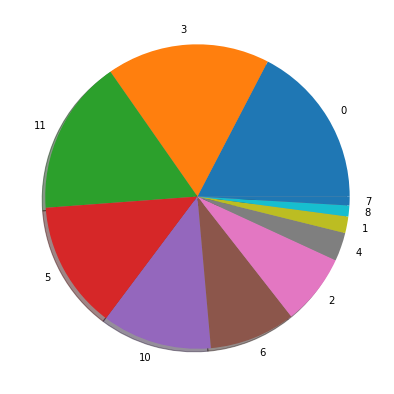

In [ ]:
plt.figure(figsize=(7,7))
tdf = train_df['employee'].value_counts()
plt.pie(tdf, labels= tdf.index,  shadow=True)
plt.show()

In [ ]:
df[df[0].str.contains(r'05-24.*08:12:25', regex=True)].index[0]

26

In [ ]:
train_df['re_str'] = train_df['date'].str[6:10] + '.*' + train_df['date'].str[-8:]
train_df

In [ ]:
for idx, row in train_df.iterrows():
  frame_number = df[df[0].str.contains(row['re_str'], regex=True)]
  if len(frame_number) == 1:
    train_df.loc[idx, 'frame_number'] = frame_number.index[0]
  else:
    print(row['date'])

train_df

In [ ]:
with open('train2_time_pd.pickle', 'rb') as f:
    df2 = pickle.load(f)
df2

,0
0,05-26-2022 Thu 08:02:47
1,05-26-2022 Thu 08:02:48
2,05-26-2022 Thu 08:02:49
3,05-26-2022 Thu 08:02:50
4,05-26-2022 Thu 08:02:51
...,...
20011,05-28-2022 Sat 07:46:34
20012,05-28-2022 Sat 07:46:35
20013,05-28-2022 Sat 07:46:36
20014,05-28-2022 Sat 07:46:37


In [ ]:
for idx, row in train_df.loc[1270:].iterrows():
  frame_number = df2[df2[0].str.contains(row['re_str'], regex=True)]
  if len(frame_number) == 1:
    train_df.loc[idx, 'frame_number'] = frame_number.index[0]
  else:
    print(row['date'])

train_df

In [ ]:
train_df

,id,date,employee,action,re_str,frame_number
0,1256,2022-05-24 08:08:36,2,15.0,05-24.*08:08:36,3.0
1,1257,2022-05-24 08:08:37,2,4.0,05-24.*08:08:37,4.0
2,1258,2022-05-24 08:12:13,3,15.0,05-24.*08:12:13,14.0
3,1259,2022-05-24 08:12:25,3,2.0,05-24.*08:12:25,26.0
4,1260,2022-05-24 08:12:42,3,12.0,05-24.*08:12:42,37.0
...,...,...,...,...,...,...
3514,4770,2022-05-28 07:42:51,0,4.0,05-28.*07:42:51,19963.0
3515,4771,2022-05-28 07:44:27,0,14.0,05-28.*07:44:27,19969.0
3516,4772,2022-05-28 07:44:36,0,3.0,05-28.*07:44:36,19978.0
3517,4773,2022-05-28 07:46:21,0,13.0,05-28.*07:46:21,19998.0


In [ ]:
train_df.to_csv('/content/drive/MyDrive/Bashko/irkutsk_train.csv', index=False)

## Test2Frame

In [ ]:
import pickle

with open('test_time_pd.pickle', 'rb') as f:
    df = pickle.load(f)
df

In [ ]:
test_df = pd.read_csv('/content/test/test.csv')
test_df['re_str'] = test_df['date'].str[6:10] + '.*' + test_df['date'].str[-8:]
test_df

,id,date,re_str
0,135,2022-05-22 11:51:06,5-22.*11:51:06
1,136,2022-05-22 11:51:25,5-22.*11:51:25
2,137,2022-05-22 12:04:27,5-22.*12:04:27
3,138,2022-05-22 12:07:56,5-22.*12:07:56
4,139,2022-05-22 12:08:10,5-22.*12:08:10
...,...,...,...
1116,1251,2022-05-24 07:57:00,5-24.*07:57:00
1117,1252,2022-05-24 07:57:32,5-24.*07:57:32
1118,1253,2022-05-24 07:57:34,5-24.*07:57:34
1119,1254,2022-05-24 07:57:39,5-24.*07:57:39


In [ ]:
df = time_list_pd
for idx, row in test_df.iterrows():
  frame_number = df[df[0].str.contains(row['re_str'], regex=True)]
  if len(frame_number) == 1:
    test_df.loc[idx, 'frame_number'] = frame_number.index[0]
  else:
    print(row['date'])

test_df

2022-05-22 13:19:00
2022-05-22 15:00:00
2022-05-22 15:00:11
2022-05-22 16:13:27
2022-05-22 20:56:55
2022-05-23 12:59:27
2022-05-23 16:01:11
2022-05-23 17:19:00
2022-05-23 18:02:00
2022-05-23 18:08:18
2022-05-23 18:44:37
2022-05-23 18:44:33
2022-05-23 18:45:50
2022-05-23 18:45:54
2022-05-23 21:47:11
2022-05-23 21:49:15
2022-05-24 00:04:01
2022-05-24 07:51:26


,id,date,re_str,frame_number
0,135,2022-05-22 11:51:06,5-22.*11:51:06,233.0
1,136,2022-05-22 11:51:25,5-22.*11:51:25,252.0
2,137,2022-05-22 12:04:27,5-22.*12:04:27,278.0
3,138,2022-05-22 12:07:56,5-22.*12:07:56,289.0
4,139,2022-05-22 12:08:10,5-22.*12:08:10,303.0
...,...,...,...,...
1116,1251,2022-05-24 07:57:00,5-24.*07:57:00,12435.0
1117,1252,2022-05-24 07:57:32,5-24.*07:57:32,12438.0
1118,1253,2022-05-24 07:57:34,5-24.*07:57:34,12440.0
1119,1254,2022-05-24 07:57:39,5-24.*07:57:39,12445.0


In [ ]:
test_df.to_csv('/content/drive/MyDrive/Bashko/irkutsk_test.csv', index=False)

In [ ]:
!cp /content/drive/MyDrive/Bashko/irkutsk_test.csv .

# 3 FFMPEG_VideoReader

In [ ]:
# Get nth frame from a video
from moviepy.video.io.ffmpeg_reader import FFMPEG_VideoReader

cap2 = FFMPEG_VideoReader("/content/train/train1.avi",True)
cap2.initialize()
cap2.get_frame(15)

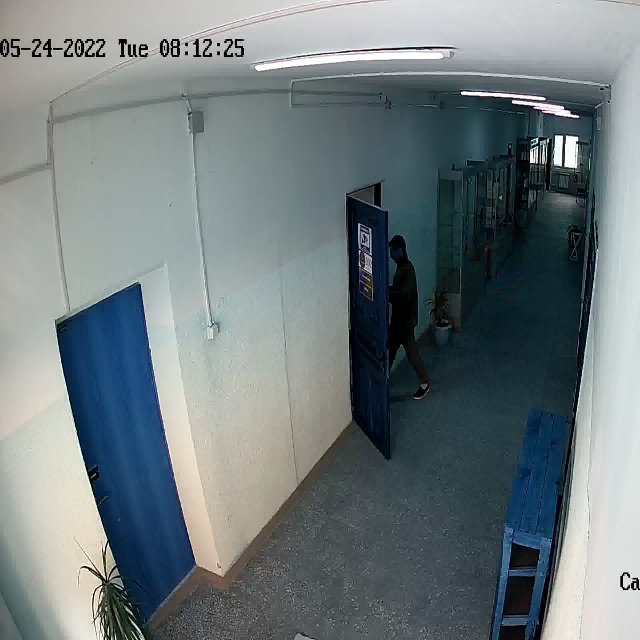

(640, 640, 3)

In [ ]:
img = cap2.get_frame(26)
# img = img[:,:1920]
# img = cv.resize(img, (640,640))
cv2_imshow(img)
img.shape

In [ ]:
%cd train_ds/

for idx, row in tqdm(train_df.loc[:1270].iterrows()):
  frame_number = row['frame_number']
  if pd.isna(frame_number):
    continue

  img = cap2.get_frame(frame_number)
  img = img[:,:1920]
  img = cv.resize(img, (640,640))

  filename = str(row['id']) + '.jpg'
  if cv.imwrite(filename, img) == 0:
        print('error')

[Errno 2] No such file or directory: 'train_ds/'
/content/train_ds


1271it [14:37,  1.45it/s]


# 4 Frame generation

Извлечение и сохранение ключевых кадров из train

In [ ]:
!cp /content/drive/MyDrive/Bashko/irkutsk_train.csv .

In [ ]:
train_df = pd.read_csv('/content/irkutsk_train.csv')
train_df

,id,date,employee,action,re_str,frame_number
0,1256,2022-05-24 08:08:36,2,15.0,05-24.*08:08:36,3.0
1,1257,2022-05-24 08:08:37,2,4.0,05-24.*08:08:37,4.0
2,1258,2022-05-24 08:12:13,3,15.0,05-24.*08:12:13,14.0
3,1259,2022-05-24 08:12:25,3,2.0,05-24.*08:12:25,26.0
4,1260,2022-05-24 08:12:42,3,12.0,05-24.*08:12:42,37.0
...,...,...,...,...,...,...
3514,4770,2022-05-28 07:42:51,0,4.0,05-28.*07:42:51,19963.0
3515,4771,2022-05-28 07:44:27,0,14.0,05-28.*07:44:27,19969.0
3516,4772,2022-05-28 07:44:36,0,3.0,05-28.*07:44:36,19978.0
3517,4773,2022-05-28 07:46:21,0,13.0,05-28.*07:46:21,19998.0


In [ ]:
train_df.loc[1269]

In [ ]:
# train_df_video1 = train_df.loc[:1269]
train_df_video1 = train_df.loc[1270:]     # второе видео

In [ ]:
test_df = pd.read_csv('/content/irkutsk_test.csv')
train_df_video1 = test_df
test_df

In [ ]:
test_df

In [ ]:
!mkdir /content/test_ds
%cd /content/test_ds/

/content/test_ds



  0%|          | 7/3300 [03:08<24:40:08, 26.97s/it]

  1%|          | 33/3300 [01:11<1:01:08,  1.12s/it]

id                              167
date            2022-05-22 12:54:59
re_str               5-22.*12:54:59
frame_number                  600.0
Name: 32, dtype: object


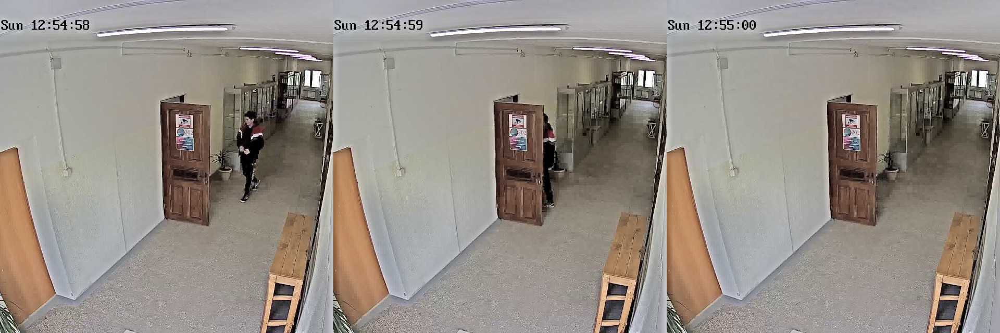

10  min



  6%|▌         | 186/3300 [03:48<40:01,  1.30it/s]

id                              328
date            2022-05-22 17:15:53
re_str               5-22.*17:15:53
frame_number                 1900.0
Name: 193, dtype: object


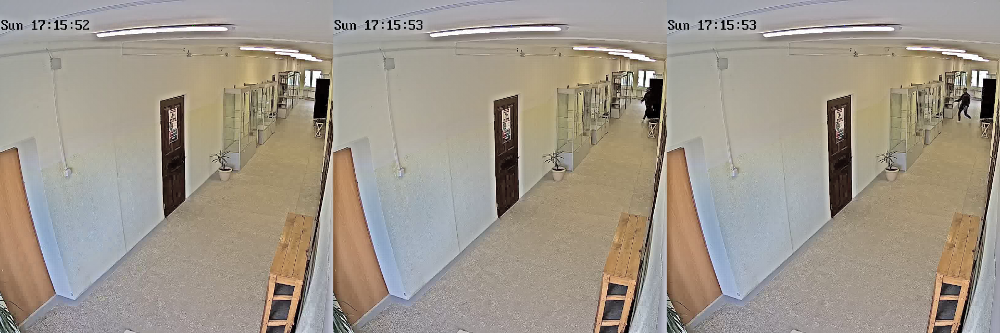

32  min



  7%|▋         | 234/3300 [05:00<1:06:09,  1.29s/it]

id                              377
date            2022-05-23 07:03:33
re_str               5-23.*07:03:33
frame_number                 2500.0
Name: 242, dtype: object


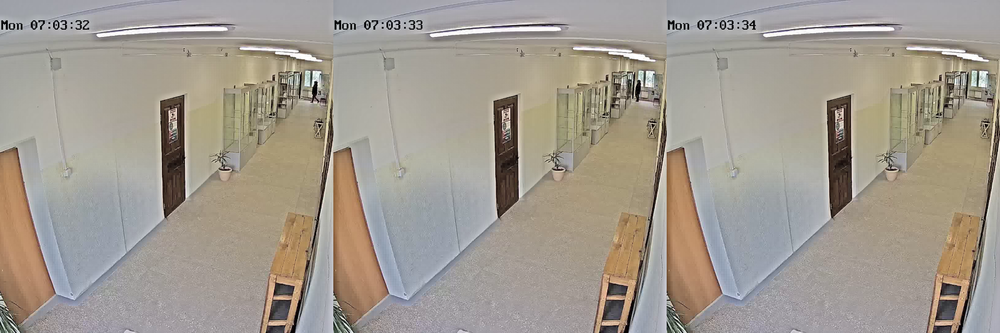

42  min



  8%|▊         | 260/3300 [05:26<1:16:33,  1.51s/it]

id                              404
date            2022-05-23 07:31:34
re_str               5-23.*07:31:34
frame_number                 2700.0
Name: 269, dtype: object


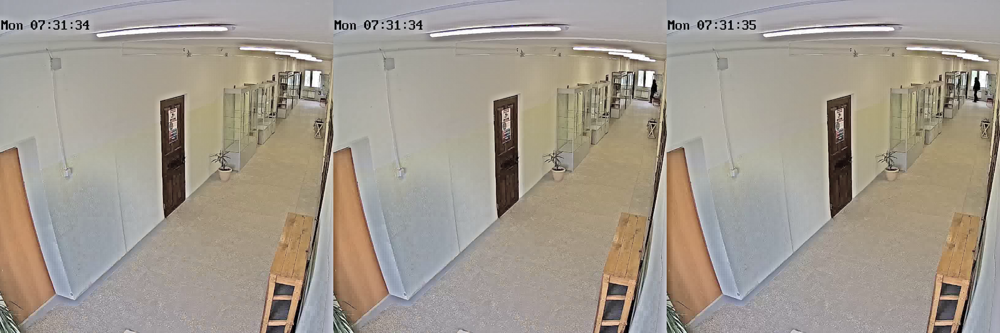

45  min



 10%|█         | 337/3300 [06:55<1:11:13,  1.44s/it]

id                              482
date            2022-05-23 08:17:47
re_str               5-23.*08:17:47
frame_number                 3400.0
Name: 347, dtype: object


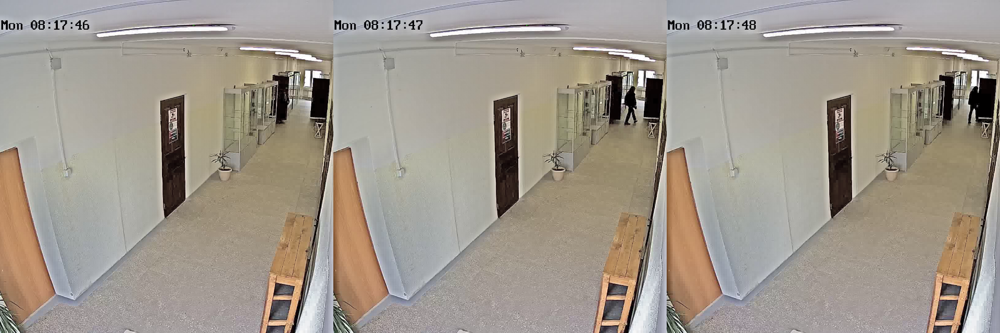


 10%|█         | 338/3300 [06:56<1:01:34,  1.25s/it]

57  min



 11%|█         | 355/3300 [07:21<2:14:38,  2.74s/it]

id                              500
date            2022-05-23 08:43:22
re_str               5-23.*08:43:22
frame_number                 3600.0
Name: 365, dtype: object


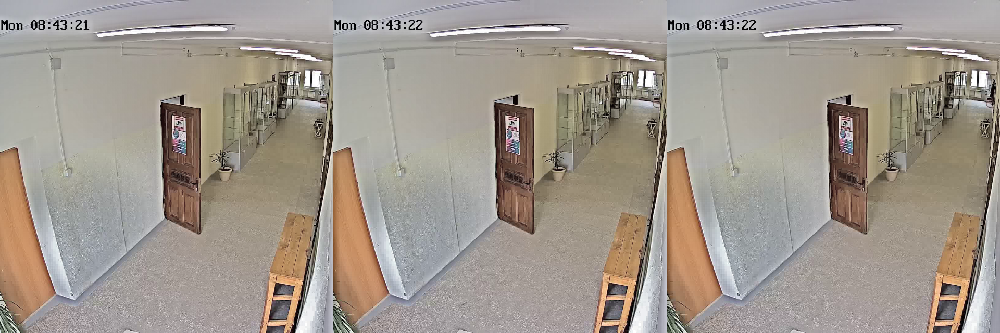

60  min



 14%|█▎        | 446/3300 [09:54<56:57,  1.20s/it]

id                              591
date            2022-05-23 11:14:15
re_str               5-23.*11:14:15
frame_number                 4800.0
Name: 456, dtype: object


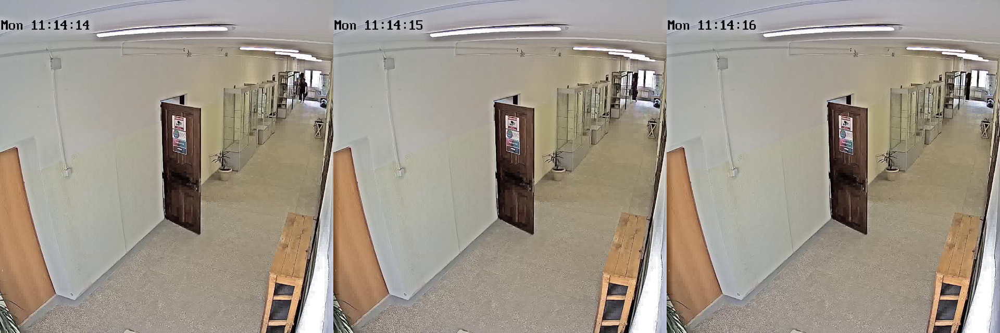

80  min



 21%|██        | 685/3300 [16:33<45:13,  1.04s/it]

id                              839
date            2022-05-23 14:10:12
re_str               5-23.*14:10:12
frame_number                 7900.0
Name: 704, dtype: object


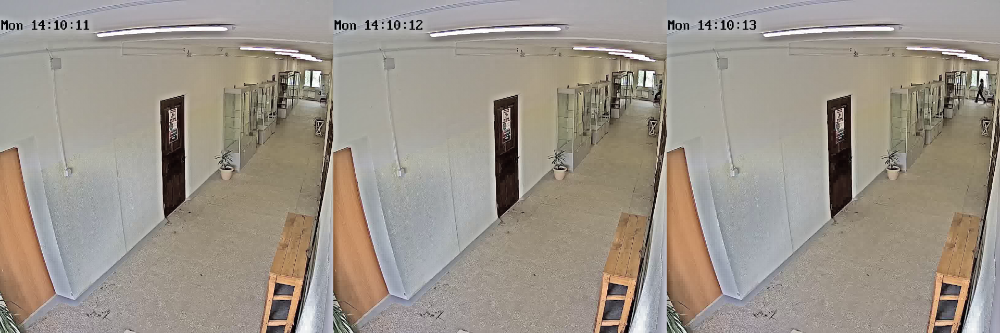

132  min



 24%|██▍       | 786/3300 [18:57<56:45,  1.35s/it]

id                              942
date            2022-05-23 16:36:48
re_str               5-23.*16:36:48
frame_number                 9000.0
Name: 807, dtype: object


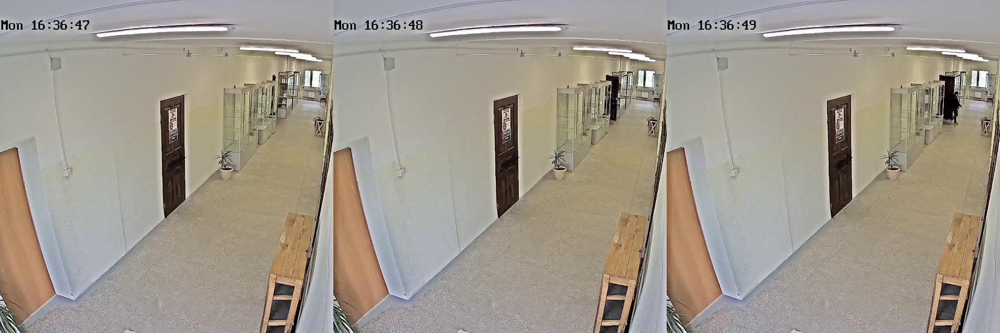

150  min



 26%|██▌       | 860/3300 [20:42<58:48,  1.45s/it]  

id                             1018
date            2022-05-23 17:09:18
re_str               5-23.*17:09:18
frame_number                 9800.0
Name: 883, dtype: object


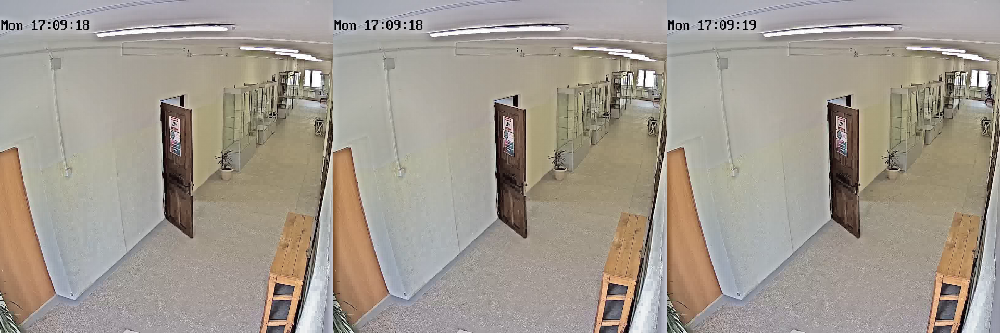

163  min



 28%|██▊       | 936/3300 [22:42<1:04:39,  1.64s/it]

id                             1102
date            2022-05-23 19:27:07
re_str               5-23.*19:27:07
frame_number                10700.0
Name: 967, dtype: object


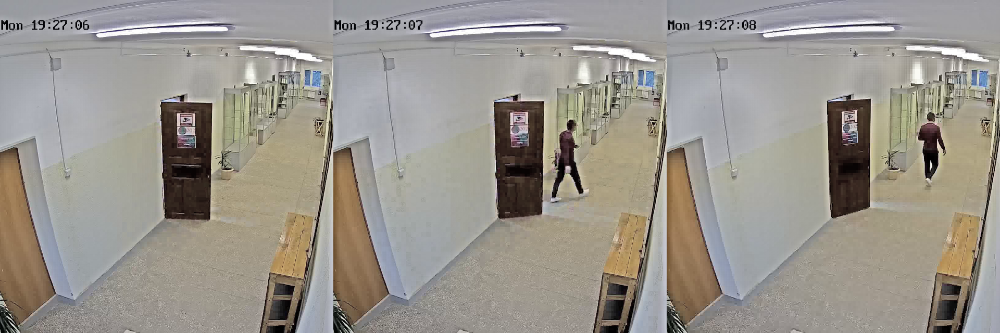

178  min



 29%|██▉       | 962/3300 [23:34<36:40,  1.06it/s]

id                             1130
date            2022-05-24 00:03:33
re_str               5-24.*00:03:33
frame_number                11100.0
Name: 995, dtype: object


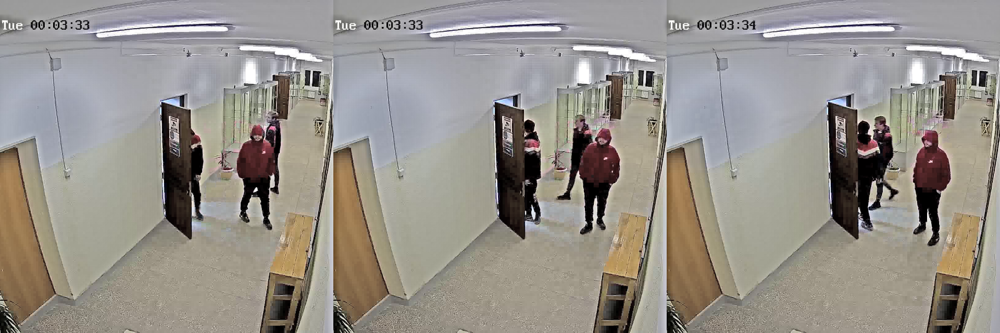

185  min



 33%|███▎      | 1085/3300 [26:37<54:21,  1.47s/it]


In [ ]:
def crop_resize1(img):
  img = img[100:,:1820]                # [400:,300:1820]
  img = cv.resize(img, (640,640))

  return img

def crop_resize2(img):
  img = img[:,260:1340]              # [400:,300:1820]
  img = cv.resize(img, (640,640))

  return img

vid = '/content/test/test.avi'
cap = cv.VideoCapture(vid)
# frame_count = cap.get(cv.CAP_PROP_FRAME_COUNT)
t = tqdm(total=3300)            # Initialise

frame_count = -20
success = True
frame_buf = []


while success:
  success, img = cap.read()
  if len(frame_buf) == 40:
    frame_buf.pop(0)
  frame_buf.append(img)

  if frame_count % 25 == 0:
    frame_number = frame_count / 25
    row = train_df_video1[train_df_video1['frame_number'] == frame_number]

    if len(row) == 0:
      frame_count += 1
      continue

    t.update(1)
    row = row.iloc[0]
    img = crop_resize2(img)
    filename = str(row['id']) + '_2.jpg'
    if cv.imwrite(filename, img) == 0:
          print('error')

    img_prev20 = crop_resize2(frame_buf[0])
    filename = filename[:-6] + '_0.jpg'
    if cv.imwrite(filename, img_prev20) == 0: print('error')

    img_prev10 = crop_resize2(frame_buf[20])
    filename = filename[:-6] + '_1.jpg'
    if cv.imwrite(filename, img_prev10) == 0: print('error')

    if frame_count % 2500 == 0:                             # 5 minutes
      print(row)
      img = np.hstack([img_prev20,img_prev10, img])
      img = preprocess_img(img)
      cv2_imshow(img)
      print(round(cap.get(cv.CAP_PROP_POS_MSEC)/60000), ' min')

  frame_count += 1

  # if frame_count == 9000:
  #   break

t.close()

In [ ]:
# vid = '/content/train/train2.avi'
# cap = cv.VideoCapture(vid)
success, img = cap.read()
img = img[:, 260:1340]
cv2_imshow(img)
img.shape

## Preprocessing

Препроцессинг для осветления теней и выравнивания гистрограммы

In [ ]:
def light_shadow_correction(
        img,
        shadow_amount_percent, shadow_tone_percent, shadow_radius,
        highlight_amount_percent, highlight_tone_percent, highlight_radius,
        color_percent, protect_text = True
):
    """
    Image Shadow / Highlight Correction. The same function as it in Photoshop / GIMP
    :param img: input RGB image numpy array of shape (height, width, 3)
    :param shadow_amount_percent [0.0 ~ 1.0]: Controls (separately for the highlight and shadow values in the image) how much of a correction to make.
    :param shadow_tone_percent [0.0 ~ 1.0]: Controls the range of tones in the shadows or highlights that are modified.
    :param shadow_radius [>0]: Controls the size of the local neighborhood around each pixel

    :param highlight_amount_percent [0.0 ~ 1.0]: Controls (separately for the highlight and shadow values in the image) how much of a correction to make.
    :param highlight_tone_percent [0.0 ~ 1.0]: Controls the range of tones in the shadows or highlights that are modified.
    :param highlight_radius [>0]: Controls the size of the local neighborhood around each pixel

    :param color_percent [-1.0 ~ 1.0]:
    :return:
    https://gist.github.com/HViktorTsoi/8e8b0468a9fb07842669aa368382a7df
    """
    shadow_tone = shadow_tone_percent * 255
    highlight_tone = 255 - highlight_tone_percent * 255

    shadow_gain = 1 + shadow_amount_percent * 6
    highlight_gain = 1 + highlight_amount_percent * 6

    # extract RGB channel
    height, width = img.shape[:2]
    img = img.astype(np.float)
    img_R, img_G, img_B = img[..., 2].reshape(-1), img[..., 1].reshape(-1), img[..., 0].reshape(-1)

    # The entire correction process is carried out in YUV space,
    # adjust highlights/shadows in Y space, and adjust colors in UV space
    # convert to Y channel (grey intensity) and UV channel (color)
    img_Y = .3 * img_R + .59 * img_G + .11 * img_B
    img_U = -img_R * .168736 - img_G * .331264 + img_B * .5
    img_V = img_R * .5 - img_G * .418688 - img_B * .081312

    # extract shadow / highlight
    shadow_map = 255 - img_Y * 255 / shadow_tone
    shadow_map[np.where(img_Y >= shadow_tone)] = 0
    highlight_map = 255 - (255 - img_Y) * 255 / (255 - highlight_tone)
    highlight_map[np.where(img_Y <= highlight_tone)] = 0

    # // Gaussian blur on tone map, for smoother transition
    if shadow_amount_percent * shadow_radius > 0:
        # shadow_map = cv2.GaussianBlur(shadow_map.reshape(height, width), ksize=(shadow_radius, shadow_radius), sigmaX=0).reshape(-1)
        shadow_map = cv2.blur(shadow_map.reshape(height, width), ksize=(shadow_radius, shadow_radius)).reshape(-1)

    if highlight_amount_percent * highlight_radius > 0:
        # highlight_map = cv2.GaussianBlur(highlight_map.reshape(height, width), ksize=(highlight_radius, highlight_radius), sigmaX=0).reshape(-1)
        highlight_map = cv2.blur(highlight_map.reshape(height, width), ksize=(highlight_radius, highlight_radius)).reshape(-1)

    # Tone LUT
    t = np.arange(256)
    LUT_shadow = (1 - np.power(1 - t * (1 / 255), shadow_gain)) * 255
    LUT_shadow = np.maximum(0, np.minimum(255, np.int_(LUT_shadow + .5)))
    LUT_highlight = np.power(t * (1 / 255), highlight_gain) * 255
    LUT_highlight = np.maximum(0, np.minimum(255, np.int_(LUT_highlight + .5)))

    # adjust tone
    shadow_map = shadow_map * (1 / 255)
    highlight_map = highlight_map * (1 / 255)

    iH = (1 - shadow_map) * img_Y + shadow_map * LUT_shadow[np.int_(img_Y)]
    iH = (1 - highlight_map) * iH + highlight_map * LUT_highlight[np.int_(iH)]
    img_Y = iH

    # adjust color
    if color_percent != 0:
        # color LUT
        if color_percent > 0:
            LUT = (1 - np.sqrt(np.arange(32768)) * (1 / 128)) * color_percent + 1
        else:
            LUT = np.sqrt(np.arange(32768)) * (1 / 128) * color_percent + 1

        # adjust color saturation adaptively according to highlights/shadows
        color_gain = LUT[np.int_(img_U ** 2 + img_V ** 2 + .5)]
        w = 1 - np.minimum(2 - (shadow_map + highlight_map), 1)
        img_U = w * img_U + (1 - w) * img_U * color_gain
        img_V = w * img_V + (1 - w) * img_V * color_gain

    # re convert to RGB channel
    output_R = np.int_(img_Y + 1.402 * img_V + .5)
    output_G = np.int_(img_Y - .34414 * img_U - .71414 * img_V + .5)
    output_B = np.int_(img_Y + 1.772 * img_U + .5)

    output = np.row_stack([output_B, output_G, output_R]).T.reshape(height, width, 3)
    output = np.minimum(output, 255).astype(np.uint8)
    return output

In [ ]:
def preprocess_img(img):
  img = light_shadow_correction(img,
                          .6, 0.7, 25,
                          .8, 0.3, 25,
                          0, protect_text=False)

  # img2 = autoAdjustments_with_convertScaleAbs(img, 0.01, 0.99)

  return img

In [ ]:
preprocess_img(img)

In [ ]:
def vid_preprocessor(path):
  for filename in tqdm(glob.glob(path + '*.jpg', recursive=False)):
    image = cv.imread(filename).astype('uint8')

    image = preprocess_img(image)
    if cv.imwrite((path+'../test_pp/'+os.path.split(filename)[1]), image) == 0:
      print('error')

  return 1

vid_preprocessor('/content/test_ds/')

100%|██████████| 3255/3255 [04:39<00:00, 11.65it/s]


1

In [ ]:
%cd /content/
!zip train_pp1.zip pp/*
!zip train_pp2.zip pp2/*

In [ ]:
%cd /content/
!zip test_pp.zip test_pp/*

# 5 Yolo inference (labeling)

Автоматическая разметка при помощи YOLO

In [ ]:
import torch

model = torch.hub.load('ultralytics/yolov5', 'yolov5l', pretrained=True)

In [ ]:
!unzip train_pp1.zip
!unzip train_pp2.zip

In [ ]:
fnames = glob.iglob('pp/*')
next(fnames)

pp/1991_0.jpg
CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 9.54 µs


Saved 1 image to runs/detect/exp


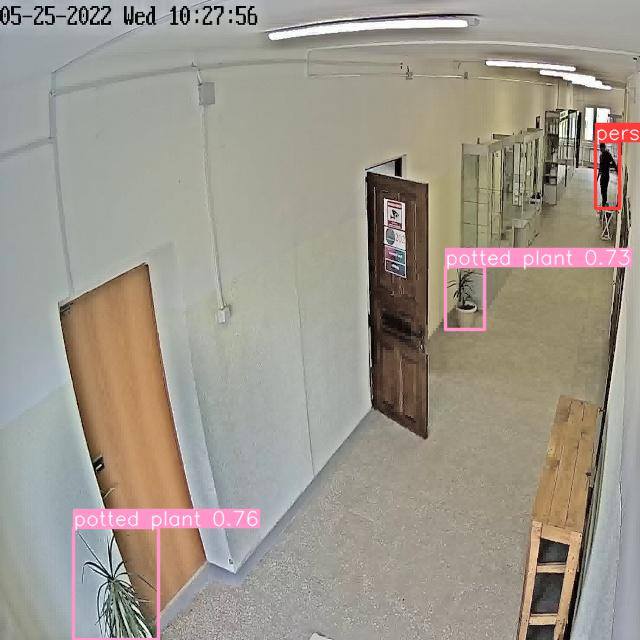

      xcenter    ycenter      width     height  confidence  class    name  \
0  607.615417  175.36113  24.035278  66.978058    0.789217      0  person   

    file_name  employee  action  
0  1991_0.jpg         3    16.0  


In [ ]:
# img_files = '/content/pp/1296_2.jpg'
img_files = next(fnames)
print(img_files)

file_name = os.path.split(img_files)[1]
frame_num = file_name.split('_')[0]

results = model(img_files)
results.save()
!mv /content/runs/detect/exp*/* /content/runs/detect/
!rmdir /content/runs/detect/* > /dev/null 2>&1
img = cv.imread('/content/runs/detect/' + file_name)
cv2_imshow(img)

tdf = results.pandas().xywh[0]
tdf = tdf[tdf['name'] == 'person']
if len(tdf) == 1:
  tdf['file_name'] = file_name
  train_df_row = train_df[train_df['id'] == int(frame_num)].iloc[0]
  tdf['employee'] = train_df_row['employee']
  tdf['action'] = train_df_row['action']
  annot_df = annot_df.append(tdf)
elif len(tdf) > 1:
  many_men.append()

1296_2.jpg

In [ ]:
train_df[train_df['id'] == int(frame_num)]
# train_df[train_df['date'] == '2022-05-24 21:48:36']

,id,date,employee,action,re_str,frame_number
129,1385,2022-05-24 10:29:14,5,4.0,05-24.*10:29:14,1063.0


In [ ]:
import shutil

fnames = glob.glob('pp2/*') # [:10]
annot_df = pd.DataFrame()
dst = 'annot2/'
many_men = []

for img_files in tqdm(fnames, total = len(fnames)):
  file_name = os.path.split(img_files)[1]
  frame_num = file_name.split('_')[0]

  results = model(img_files)
  tdf = results.pandas().xywhn[0]
  tdf = tdf.loc[tdf['name'] == 'person']
  if len(tdf) == 1:
    tdf = tdf.iloc[0]
    tdf['file_name'] = file_name
    train_df_row = train_df[train_df['id'] == int(frame_num)].iloc[0]
    tdf['employee'] = train_df_row['employee']
    tdf['action'] = train_df_row['action']
    annot_df = annot_df.append(tdf)

    shutil.copyfile(img_files, dst+file_name)
    with open(dst + os.path.splitext(file_name)[0]+'.txt', 'w') as f:
      write_str = str(tdf['employee']) +' '+ str(tdf['xcenter']) +' '+ str(tdf['ycenter']) \
         +' '+ str(tdf['width']) +' '+ str(tdf['height'])
      f.write(write_str)

  elif len(tdf) > 1:
    many_men.append(file_name)

print('/n Несколько чел: ', len(many_men))
annot_df

 73%|███████▎  | 4340/5973 [02:34<00:57, 28.57it/s]/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:1056: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cacher_needs_updating = self._check_is_chained_assignment_possible()
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1724: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer_missing(indexer, value)
100%|██████████| 5973/5973 [03:32<00:00, 28.16it/s]

/n Несколько чел:  1021


,xcenter,ycenter,width,height,confidence,class,name,file_name,employee,action
2,0.964595,0.263926,0.021232,0.061063,0.277676,0.0,person,3589_2.jpg,5.0,15.0
1,0.954671,0.611339,0.052157,0.218314,0.486263,0.0,person,4458_0.jpg,11.0,18.0
2,0.948138,0.617184,0.049304,0.122422,0.325373,0.0,person,3739_0.jpg,11.0,18.0
0,0.923113,0.284525,0.031878,0.081960,0.854052,0.0,person,3516_0.jpg,0.0,4.0
0,0.933859,0.275414,0.035236,0.068618,0.858146,0.0,person,4116_0.jpg,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...
0,0.937475,0.279871,0.030261,0.080386,0.842228,0.0,person,4227_2.jpg,3.0,15.0
1,0.910875,0.268410,0.021125,0.082407,0.369162,0.0,person,3646_1.jpg,0.0,14.0
1,0.903101,0.273098,0.024292,0.067883,0.728564,0.0,person,3852_2.jpg,0.0,14.0
1,0.949373,0.269631,0.025068,0.077945,0.724447,0.0,person,3365_1.jpg,0.0,5.0


In [ ]:
tdf['employee']

10

In [ ]:
annot_df.to_csv('annot_pp2.csv', index=False)

In [ ]:
!cp annot*.csv /content/drive/MyDrive/Bashko/

In [ ]:
!mv annot2/* annot1

In [ ]:
!zip irkutsk_annot.zip annot1/*

In [ ]:
dir(results)

# 6 YOLO training

Обучение YOLO новым ds

In [ ]:
%cd /content
!unzip irkutsk_annot.zip

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt

In [ ]:
!mkdir images
!mkdir images/train
!mkdir images/val
!mkdir labels
!mkdir labels/train
!mkdir labels/val

In [ ]:
import random

filelist  = glob.glob('annot1/*.txt')
test = random.sample(filelist, int(len(filelist)*0.2))
output_path = 'labels/val/'
output_img_path = 'images/val/'

if not os.path.exists(output_path):
    os.makedirs(output_path)

for file in tqdm(test):
    txtpath = file
    impath = file[:-4] + '.jpg'

    out_text = os.path.join(output_path, os.path.basename(txtpath))
    out_image = os.path.join(output_img_path, os.path.basename(impath))

    # print(txtpath,impath,out_text,out_image)
    os.system('mv ' + txtpath + ' ' + out_text)
    os.system('mv ' + impath + ' ' + out_image)

100%|██████████| 784/784 [00:13<00:00, 56.89it/s]


In [ ]:
!ls /content/images/val | wc -l
!ls /content/labels/val | wc -l

794
794


In [ ]:
!mv annot1/*.txt /content/labels/train
!mv annot1/*.jpg /content/images/train

In [ ]:
%%writefile irkutsk.yaml
# train and val data as 1) directory: path/images/, 2) file: path/images.txt, or 3) list: [path1/images/, path2/images/]
train: /content/images/train
val: /content/images/val

# number of classes
nc: 12

# class names
names: ['person', 'Maria', 'Asia', 'Ivan', 'Sergey', 'Daniil', 'Cleaning', 'Olga', 'Artur', 'Nataliya',
  'visitor', 'young_visitor']

Overwriting irkutsk.yaml


In [ ]:
# Train YOLOv5s on COCO128 for 5 epochs
!python yolov5/train.py --img 640 --batch 16 --epochs 5 --data irkutsk.yaml --weights yolov5l.pt

train: weights=yolov5l.pt, cfg=, data=irkutsk.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-89-g5cb9fe6 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.01

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train

In [ ]:
!python yolov5/train.py --img 640 --batch 16 --epochs 25 --data irkutsk.yaml \
  --weights yolov5/runs/train/exp3/weights/best.pt --cache

train: weights=yolov5/runs/train/exp3/weights/best.pt, cfg=, data=irkutsk.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-89-g5cb9fe6 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4

In [ ]:
!mv images ds
!mv labels ds
!zip -r irkutsk_ds.zip ds

In [ ]:
!zip -r yolo_run.zip /content/yolov5/runs/train/exp4

# 7 Test inference

Генерация пробного сабмита

In [ ]:
%cd /content
!unzip yolo_run.zip
!unzip test_pp.zip

In [ ]:
!cp /content/drive/MyDrive/Bashko/annot*.csv /content

In [ ]:
train_df = pd.read_csv('/content/annot_pp1.csv')
train_df

,xcenter,ycenter,width,height,confidence,class,name,file_name,employee,action
0,0.904354,0.228110,0.020669,0.084833,0.757584,0.0,person,1499_1.jpg,10.0,4.0
1,0.828878,0.384081,0.035704,0.190578,0.548371,0.0,person,2306_1.jpg,10.0,15.0
2,0.914068,0.243850,0.021712,0.080036,0.812386,0.0,person,1277_0.jpg,6.0,4.0
3,0.946682,0.279492,0.036646,0.094806,0.869734,0.0,person,2499_2.jpg,10.0,16.0
4,0.779501,0.725456,0.099600,0.277956,0.869839,0.0,person,2282_2.jpg,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...
1498,0.927229,0.230881,0.024781,0.083804,0.864684,0.0,person,1705_0.jpg,5.0,5.0
1499,0.764569,0.573468,0.082632,0.354885,0.886263,0.0,person,2433_2.jpg,10.0,18.0
1500,0.906127,0.229211,0.018611,0.074543,0.759639,0.0,person,1894_0.jpg,3.0,4.0
1501,0.907107,0.225654,0.019591,0.081726,0.690346,0.0,person,2347_0.jpg,5.0,4.0


In [ ]:
!python yolov5/detect.py --weights '/content/yolov5/runs/train/exp4/weights/best.pt'  \
  --source 'test_pp' --project 'irkutsk' \
  --name 'detect_test' --augment --line=3 --save-txt --save-conf # --nosave #  --conf 0.6

In [ ]:
!zip -j /content/test_labels.zip /content/irkutsk/detect_test/labels/*
!cp /content/test_labels.zip /content/drive/MyDrive/Bashko/

In [ ]:
# !cp /content/drive/MyDrive/Bashko/test_labels.zip  /content/
!mkdir test_labels
!unzip test_labels.zip -d test_labels

In [ ]:
df = pd.DataFrame(columns=['xcenter', 'ycenter', 'width', 'height', 'confidence',
       'file_name', 'employee', 'action'])
df

,xcenter,ycenter,width,height,confidence,file_name,employee,action


In [ ]:
fnames = glob.glob('test_labels/*')
for fname in fnames:
  with open(fname, 'r') as f:
    for line in f:
      line = line[:-1].split(' ')
      file_dict = {
          'employee': int(line[0]),
          'xcenter': float(line[1]),
          'ycenter': float(line[2]),
          'width': float(line[3]),
          'height': float(line[4]),
          'confidence': float(line[5]),
          'file_name' : os.path.split(fname)[1][:-4]
      }
      df = df.append(file_dict, ignore_index=True)
df

In [ ]:
df.to_csv('all_test_labels.csv', index=False)
!cp all_test_labels.csv /content/drive/MyDrive/Bashko/

In [ ]:
# df = df.reset_index(drop=True)
df = df.loc[df.groupby('file_name')['confidence'].idxmax()]    # для скорости беру одного
df['id'] = df['file_name'].str[:-2]
df

,xcenter,ycenter,width,height,confidence,file_name,employee,action,id
4164,0.857031,0.319531,0.048438,0.120312,0.900503,1000_0,0,NaN,1000
1736,0.853906,0.320312,0.057813,0.118750,0.881351,1000_1,0,NaN,1000
371,0.869531,0.315625,0.039062,0.112500,0.891406,1000_2,0,NaN,1000
3511,0.973437,0.275000,0.021875,0.062500,0.792838,1001_0,0,NaN,1001
2102,0.979688,0.268750,0.015625,0.056250,0.445861,1002_2,6,NaN,1002
...,...,...,...,...,...,...,...,...,...
1472,0.737500,0.475000,0.075000,0.246875,0.888731,997_1,3,NaN,997
4336,0.632812,0.497656,0.109375,0.264062,0.956252,997_2,3,NaN,997
183,0.639844,0.497656,0.120312,0.257812,0.950939,998_1,3,NaN,998
1128,0.735937,0.467969,0.068750,0.248437,0.830688,998_2,0,NaN,998


In [ ]:
df = df.loc[df.groupby('id')['confidence'].idxmax()]
df

,xcenter,ycenter,width,height,confidence,file_name,employee,action,id
4164,0.857031,0.319531,0.048438,0.120312,0.900503,1000_0,0,NaN,1000
3511,0.973437,0.275000,0.021875,0.062500,0.792838,1001_0,0,NaN,1001
2102,0.979688,0.268750,0.015625,0.056250,0.445861,1002_2,6,NaN,1002
3856,0.622656,0.496094,0.101562,0.254687,0.807741,1003_0,6,NaN,1003
3476,0.613281,0.494531,0.064062,0.267188,0.885083,1004_2,0,NaN,1004
...,...,...,...,...,...,...,...,...,...
2745,0.952344,0.278906,0.023438,0.076563,0.935904,995_0,3,NaN,995
345,0.971875,0.277344,0.028125,0.073438,0.904467,996_2,3,NaN,996
4336,0.632812,0.497656,0.109375,0.264062,0.956252,997_2,3,NaN,997
183,0.639844,0.497656,0.120312,0.257812,0.950939,998_1,3,NaN,998


In [ ]:
df.to_csv('conf_test_labels.csv', index=False)
!cp conf_test_labels.csv /content/drive/MyDrive/Bashko/

In [ ]:
df.to_csv('conf_test_labels.csv', index=False)
!cp conf_test_labels.csv /content/drive/MyDrive/Bashko/

# 8 test csv

In [ ]:
!mkdir csvs
!cp /content/drive/MyDrive/Bashko/*.csv csvs

In [ ]:
test_df = pd.read_csv('csvs/irkutsk_test.csv')
test_df

,id,date,re_str,frame_number
0,135,2022-05-22 11:51:06,5-22.*11:51:06,233.0
1,136,2022-05-22 11:51:25,5-22.*11:51:25,252.0
2,137,2022-05-22 12:04:27,5-22.*12:04:27,278.0
3,138,2022-05-22 12:07:56,5-22.*12:07:56,289.0
4,139,2022-05-22 12:08:10,5-22.*12:08:10,303.0
...,...,...,...,...
1116,1251,2022-05-24 07:57:00,5-24.*07:57:00,12435.0
1117,1252,2022-05-24 07:57:32,5-24.*07:57:32,12438.0
1118,1253,2022-05-24 07:57:34,5-24.*07:57:34,12440.0
1119,1254,2022-05-24 07:57:39,5-24.*07:57:39,12445.0


In [ ]:
df = pd.read_csv('csvs/conf_test_labels.csv')
df.sort_values('id')

,xcenter,ycenter,width,height,confidence,file_name,employee,action,id
229,0.933594,0.278125,0.029687,0.065625,0.905791,135_2,2,NaN,135
230,0.926562,0.275781,0.021875,0.064062,0.860644,136_0,2,NaN,136
231,0.848437,0.324219,0.031250,0.095312,0.826854,137_0,6,NaN,137
232,0.876562,0.325000,0.040625,0.103125,0.918839,138_2,0,NaN,138
233,0.900781,0.282031,0.014063,0.042188,0.454127,139_2,6,NaN,139
...,...,...,...,...,...,...,...,...,...
224,0.968750,0.275000,0.021875,0.078125,0.516859,1251_0,10,NaN,1251
225,0.966406,0.278906,0.023438,0.070312,0.846405,1252_1,6,NaN,1252
226,0.907812,0.270312,0.018750,0.065625,0.472004,1253_0,10,NaN,1253
227,0.923437,0.272656,0.025000,0.067187,0.873105,1254_2,6,NaN,1254


In [ ]:
submit = test_df.merge(df[['id','employee']], on='id', how='left')
del submit['date']
del submit['re_str']
del submit['frame_number']
submit['action'] = 15
submit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1121 entries, 0 to 1120
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        1121 non-null   int64  
 1   employee  1055 non-null   float64
 2   action    1121 non-null   int64  
dtypes: float64(1), int64(2)
memory usage: 35.0 KB


In [ ]:
submit['employee'] = submit['employee'].fillna(0).astype('int')
submit
# submit.info()

,id,employee,action
0,135,2,15
1,136,2,15
2,137,6,15
3,138,0,15
4,139,6,15
...,...,...,...
1116,1251,10,15
1117,1252,6,15
1118,1253,10,15
1119,1254,6,15


In [ ]:
submit.to_csv('submit.csv', index=False)

# 9 XGBoost

Предсказание действий при помощи XGBoost

In [ ]:
train_df

,id,date,employee,action
0,1256,2022-05-24 08:08:36,2,15.0
1,1257,2022-05-24 08:08:37,2,4.0
2,1258,2022-05-24 08:12:13,3,15.0
3,1259,2022-05-24 08:12:25,3,2.0
4,1260,2022-05-24 08:12:42,3,12.0
...,...,...,...,...
3514,4770,2022-05-28 07:42:51,0,4.0
3515,4771,2022-05-28 07:44:27,0,14.0
3516,4772,2022-05-28 07:44:36,0,3.0
3517,4773,2022-05-28 07:46:21,0,13.0


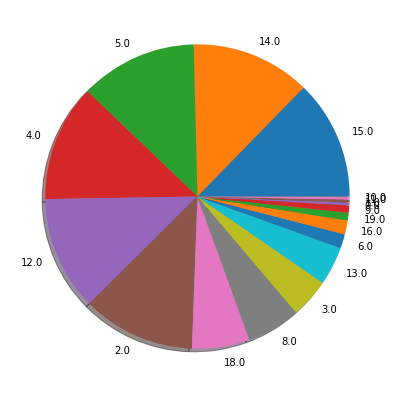

15.0    447
14.0    447
5.0     438
4.0     437
12.0    428
2.0     422
18.0    215
8.0     200
3.0     147
13.0    144
6.0      53
16.0     52
19.0     29
9.0      27
0.0      11
1.0      10
11.0     10
10.0      2
Name: action, dtype: int64

In [ ]:
plt.figure(figsize=(7,7))
tdf = train_df['action'].value_counts()
plt.pie(tdf, labels= tdf.index,  shadow=True)
plt.show()
tdf

In [ ]:
annot_df = pd.read_csv('csvs/annot_pp1.csv')
annot_df2 = pd.read_csv('csvs/annot_pp2.csv')
annot_df = annot_df.append(annot_df2).sort_values('file_name')
del annot_df['class']; del annot_df['name']
annot_df['id'] = annot_df['file_name'].str[:-6]
annot_df['alt_action'] = np.where(annot_df['action']>10,annot_df['action']-10, annot_df['action'])
annot_df

,xcenter,ycenter,width,height,confidence,file_name,employee,action,id,alt_action
1439,0.927626,0.238650,0.017640,0.065760,0.569739,1256_1.jpg,2.0,15.0,1256,5.0
604,0.919715,0.235263,0.018501,0.066203,0.765802,1257_0.jpg,2.0,4.0,1257,4.0
556,0.938001,0.237957,0.025082,0.078551,0.672398,1258_2.jpg,3.0,15.0,1258,5.0
819,0.754252,0.434738,0.059962,0.250918,0.773935,1259_0.jpg,3.0,2.0,1259,2.0
197,0.674883,0.466838,0.075597,0.277241,0.903477,1259_1.jpg,3.0,2.0,1259,2.0
...,...,...,...,...,...,...,...,...,...,...
642,0.950539,0.277868,0.026938,0.066798,0.706867,4769_1.jpg,0.0,15.0,4769,5.0
254,0.919478,0.274232,0.020878,0.068088,0.828811,4769_2.jpg,0.0,15.0,4769,5.0
1568,0.900646,0.273557,0.016696,0.067483,0.580701,4771_1.jpg,0.0,14.0,4771,4.0
2170,0.903965,0.272317,0.020436,0.069746,0.794028,4771_2.jpg,0.0,14.0,4771,4.0


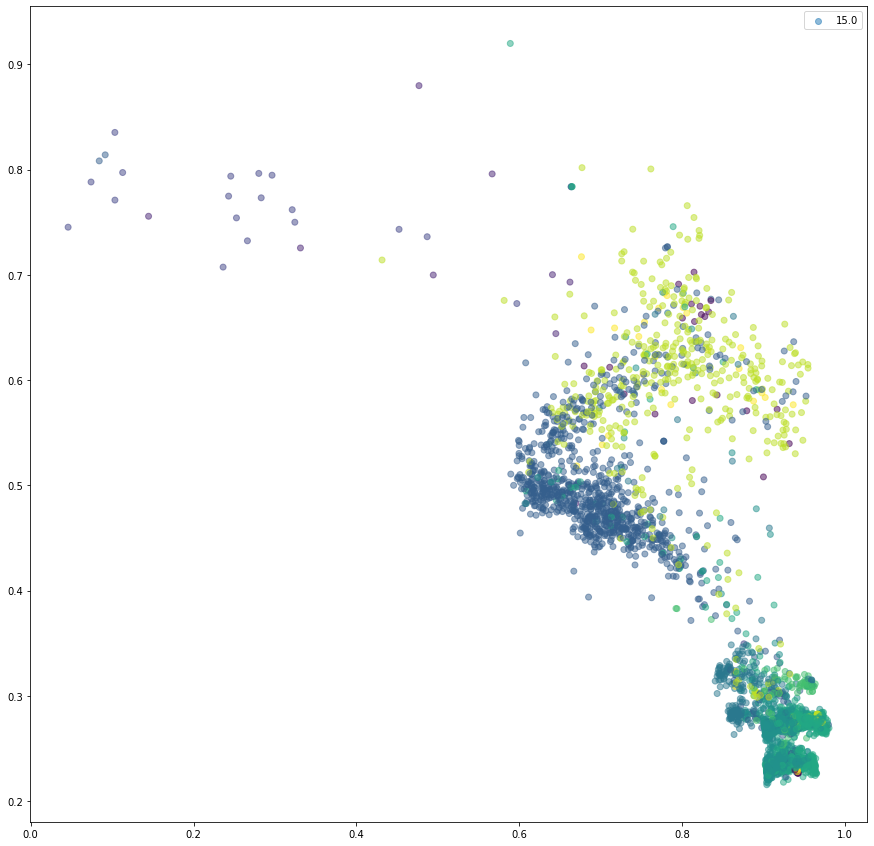

In [ ]:
plt.figure(figsize=(15,15))
plt.scatter(annot_df['xcenter'], annot_df['ycenter'], c=annot_df['alt_action'], alpha=.5)
plt.legend(annot_df['alt_action'])

In [ ]:
annot_df['alt_action'] = annot_df['alt_action'].astype('int')
annot_df

,xcenter,ycenter,width,height,confidence,file_name,employee,action,id,alt_action
1439,0.927626,0.238650,0.017640,0.065760,0.569739,1256_1.jpg,2.0,15.0,1256,5
604,0.919715,0.235263,0.018501,0.066203,0.765802,1257_0.jpg,2.0,4.0,1257,4
556,0.938001,0.237957,0.025082,0.078551,0.672398,1258_2.jpg,3.0,15.0,1258,5
819,0.754252,0.434738,0.059962,0.250918,0.773935,1259_0.jpg,3.0,2.0,1259,2
197,0.674883,0.466838,0.075597,0.277241,0.903477,1259_1.jpg,3.0,2.0,1259,2
...,...,...,...,...,...,...,...,...,...,...
642,0.950539,0.277868,0.026938,0.066798,0.706867,4769_1.jpg,0.0,15.0,4769,5
254,0.919478,0.274232,0.020878,0.068088,0.828811,4769_2.jpg,0.0,15.0,4769,5
1568,0.900646,0.273557,0.016696,0.067483,0.580701,4771_1.jpg,0.0,14.0,4771,4
2170,0.903965,0.272317,0.020436,0.069746,0.794028,4771_2.jpg,0.0,14.0,4771,4


In [ ]:
from sklearn.model_selection import train_test_split

x = annot_df[['xcenter', 'ycenter', 'width', 'height', 'confidence','employee']]
y = annot_df['alt_action']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify=y, random_state=17)
x_train

,xcenter,ycenter,width,height,confidence,employee
1488,0.939394,0.231582,0.032056,0.079008,0.832054,10.0
679,0.951657,0.272424,0.019164,0.074746,0.736662,11.0
506,0.954636,0.240593,0.022269,0.069939,0.651671,2.0
502,0.645566,0.498497,0.044177,0.212825,0.693527,2.0
1226,0.941339,0.242602,0.021499,0.074666,0.839192,6.0
...,...,...,...,...,...,...
337,0.714296,0.479329,0.085505,0.269414,0.901959,8.0
447,0.653153,0.564288,0.103971,0.278094,0.835670,0.0
1570,0.944546,0.304956,0.030640,0.094368,0.468442,0.0
403,0.909304,0.271763,0.025197,0.069181,0.725726,0.0


In [ ]:
import xgboost as xgb

dtrain = xgb.DMatrix(x_train, y_train)
dtest = xgb.DMatrix(x_test, y_test)

params = {'objective': 'multi:softmax',
          'num_class': 10,
          'max_depth': 5,
          'eta': 0.1}

num_rounds = 37
evals = [(dtest, 'test'), (dtrain, 'train')]
xgb_model = xgb.train(params, dtrain, num_rounds, evals=evals)

[0]	test-merror:0.243964	train-merror:0.202226
[1]	test-merror:0.245235	train-merror:0.199046
[2]	test-merror:0.236341	train-merror:0.193323
[3]	test-merror:0.242694	train-merror:0.188553
[4]	test-merror:0.237611	train-merror:0.185374
[5]	test-merror:0.237611	train-merror:0.184102
[6]	test-merror:0.23507	train-merror:0.183148
[7]	test-merror:0.233799	train-merror:0.185056
[8]	test-merror:0.232529	train-merror:0.183784
[9]	test-merror:0.231258	train-merror:0.183148
[10]	test-merror:0.227446	train-merror:0.18283
[11]	test-merror:0.231258	train-merror:0.179332
[12]	test-merror:0.232529	train-merror:0.178696
[13]	test-merror:0.229987	train-merror:0.176471
[14]	test-merror:0.231258	train-merror:0.174563
[15]	test-merror:0.229987	train-merror:0.174245
[16]	test-merror:0.232529	train-merror:0.174563
[17]	test-merror:0.231258	train-merror:0.174881
[18]	test-merror:0.232529	train-merror:0.173291
[19]	test-merror:0.232529	train-merror:0.172655
[20]	test-merror:0.232529	train-merror:0.171383
[21]

In [ ]:
submit = test_df.merge(df, on='id', how='left')
del submit['date']
del submit['re_str']
del submit['frame_number']
submit = submit.fillna(0)
submit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1121 entries, 0 to 1120
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          1121 non-null   int64  
 1   xcenter     1121 non-null   float64
 2   ycenter     1121 non-null   float64
 3   width       1121 non-null   float64
 4   height      1121 non-null   float64
 5   confidence  1121 non-null   float64
 6   file_name   1121 non-null   object 
 7   employee    1121 non-null   float64
 8   action      1121 non-null   float64
dtypes: float64(7), int64(1), object(1)
memory usage: 87.6+ KB


In [ ]:
dtest = submit[['xcenter', 'ycenter', 'width', 'height', 'confidence','employee']]
dtest = xgb.DMatrix(dtest)
y_pred = xgb_model.predict(dtest)
len(y_pred)

1121

In [ ]:
submit['action'] = y_pred
submit

,id,xcenter,ycenter,width,height,confidence,file_name,employee,action
0,135,0.933594,0.278125,0.029687,0.065625,0.905791,135_2,2.0,4.0
1,136,0.926562,0.275781,0.021875,0.064062,0.860644,136_0,2.0,4.0
2,137,0.848437,0.324219,0.031250,0.095312,0.826854,137_0,6.0,3.0
3,138,0.876562,0.325000,0.040625,0.103125,0.918839,138_2,0.0,3.0
4,139,0.900781,0.282031,0.014063,0.042188,0.454127,139_2,6.0,4.0
...,...,...,...,...,...,...,...,...,...
1116,1251,0.968750,0.275000,0.021875,0.078125,0.516859,1251_0,10.0,5.0
1117,1252,0.966406,0.278906,0.023438,0.070312,0.846405,1252_1,6.0,5.0
1118,1253,0.907812,0.270312,0.018750,0.065625,0.472004,1253_0,10.0,4.0
1119,1254,0.923437,0.272656,0.025000,0.067187,0.873105,1254_2,6.0,4.0


In [ ]:
submit = submit[['id', 'employee', 'action']]
submit.to_csv('submit.csv', index=False)

# 10 Time dif

Определение зашел/вышел

In [ ]:
submit = submit.merge(test_df[['id','date']], on='id')
submit['date'] = pd.to_datetime(submit['date'])

employ_group = submit.groupby('employee')
for n, val in employ_group:
  val['session'] = val['date'] - val['date'].shift(1)
  submit.loc[val.index, 'session'] = val['session']
  # print(val)
  # break

submit['action'] = submit['action'] + 10

In [ ]:
employ_group = submit.groupby('employee')
for n, val in employ_group:
  in_corridor = False
  for idx, row in val.iterrows():
    if (row['session'] < pd.Timedelta("1 min")) & (in_corridor == True):
      row['action'] = row['action'] - 10
      submit.loc[idx, 'has_left'] = True
      in_corridor = False
    else:
      in_corridor = True
      submit.loc[idx, 'has_left'] = False


In [ ]:
submit['action2'] = np.where(submit['has_left']==True, submit['action']-10, submit['action'])
submit

,id,xcenter,ycenter,width,height,confidence,file_name,employee,action,date,session,has_left,action2
0,135,0.933594,0.278125,0.029687,0.065625,0.905791,135_2,2.0,14.0,2022-05-22 11:51:06,NaT,False,14.0
1,136,0.926562,0.275781,0.021875,0.064062,0.860644,136_0,2.0,14.0,2022-05-22 11:51:25,0 days 00:00:19,True,4.0
2,137,0.848437,0.324219,0.031250,0.095312,0.826854,137_0,6.0,13.0,2022-05-22 12:04:27,NaT,False,13.0
3,138,0.876562,0.325000,0.040625,0.103125,0.918839,138_2,0.0,13.0,2022-05-22 12:07:56,NaT,False,13.0
4,139,0.900781,0.282031,0.014063,0.042188,0.454127,139_2,6.0,14.0,2022-05-22 12:08:10,0 days 00:03:43,False,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1116,1251,0.968750,0.275000,0.021875,0.078125,0.516859,1251_0,10.0,15.0,2022-05-24 07:57:00,0 days 00:00:05,True,5.0
1117,1252,0.966406,0.278906,0.023438,0.070312,0.846405,1252_1,6.0,15.0,2022-05-24 07:57:32,0 days 00:00:38,False,15.0
1118,1253,0.907812,0.270312,0.018750,0.065625,0.472004,1253_0,10.0,14.0,2022-05-24 07:57:34,0 days 00:00:34,False,14.0
1119,1254,0.923437,0.272656,0.025000,0.067187,0.873105,1254_2,6.0,14.0,2022-05-24 07:57:39,0 days 00:00:07,True,4.0


In [ ]:
submit.to_csv('submit_big.csv', index=False)

In [ ]:
# submit_xs = submit[['id','employee','action2']]
submit_xs.columns = ['id', 'employee', 'action']
submit_xs

,id,employee,action
0,135,2.0,14.0
1,136,2.0,4.0
2,137,6.0,13.0
3,138,0.0,13.0
4,139,6.0,14.0
...,...,...,...
1116,1251,10.0,5.0
1117,1252,6.0,15.0
1118,1253,10.0,14.0
1119,1254,6.0,4.0


In [ ]:
submit_xs.to_csv('submit.csv', index=False)

# 11 ToDo




1. Переразметить train датасет новой моделью и проверить разметку. Затем обучить лучшую модель. <br>
2. Предсказывать сотрудника и действие по набору кадров

# end